In [192]:
import os
from mu2e import mu2e_ext_path
from mu2e.dataframeprod import DataFrameMaker
from mu2e.mu2eplots import mu2e_plot, mu2e_plot3d
from matplotlib import gridspec
%matplotlib inline
plt.rcParams['figure.figsize'] = (12,8)
import pandas as pd
from time import sleep
import plotly.io as pio
from plotly.offline import init_notebook_mode
from skhep.visual import MplPlotter as splt
from copy import deepcopy
from lmfit import Model, Parameters, report_fit
from hallprobesim import *
from tqdm import tnrange, tqdm_notebook

In [2]:
df_long_250mm = DataFrameMaker(mu2e_ext_path+'datafiles/FieldMapsCole/bfield_map_r250mm_p10cm_lengthx10_1232173pts_09-07_160736',input_type = 'pkl').data_frame
df_short_250mm = DataFrameMaker(mu2e_ext_path+'datafiles/FieldMapsCole/bfield_map_1232173pts_08-10_094943',input_type = 'pkl').data_frame


In [178]:
phi=np.pi/2
fig = mu2e_plot3d(df_short_250mm, 'R', 'Z', 'Bz', f'R<0.15 and Phi=={phi} and -2<Z<2',
            title_simp = 'Bz, Solenoid B', df_fit=False, mode='plotly_nb', ptype='3d', units='m', aspect='rect2',
                save_dir='/Users/brianpollack/Documents/Notes_Papers/Helix/figs/')
pio.write_image(fig, '/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_bz_B.png')

/Users/brianpollack/Coding/Mu2E/mu2e/mu2eplots.py:48: DeprecationWarning:

invalid escape sequence \*

/usr/local/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:174: DeprecationWarning:

plotly.graph_objs.ColorBar is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.marker.ColorBar
  - plotly.graph_objs.surface.ColorBar
  - etc.




In [179]:
phi=0
fig = mu2e_plot3d(df_short_250mm, 'R', 'Z', 'Br', f'R<0.15 and Phi=={phi} and -2<Z<2',
            title_simp = 'Br, Solenoid B', df_fit=False, mode='plotly_nb', ptype='3d', units='m', aspect='rect2',)
pio.write_image(fig, '/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_br_B.png')

/usr/local/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:174: DeprecationWarning:

plotly.graph_objs.ColorBar is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.marker.ColorBar
  - plotly.graph_objs.surface.ColorBar
  - etc.




In [180]:
phi=3*np.pi/4
fig = mu2e_plot3d(df_short_250mm, 'R', 'Z', 'Bphi', f'R<0.15 and Phi=={phi} and -2<Z<2',
            title_simp = 'Btheta, Solenoid B', df_fit=False, mode='plotly_nb', ptype='3d', units='m', aspect='rect2',)
pio.write_image(fig, '/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_bt_B.png')

/usr/local/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:174: DeprecationWarning:

plotly.graph_objs.ColorBar is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.marker.ColorBar
  - plotly.graph_objs.surface.ColorBar
  - etc.




In [194]:
#ff_list = []
cfg_params_Cole = cfg_params(ns=1, ms=2, cns=0, cms=0, nms=0, Reff=0.1,
                             n_scale=1, m_scale=1, func_version=120)

cfg_pickle_Cole = cfg_pickle(use_pickle=False, save_pickle=True,
                             load_name='phi_test', save_name='phi_test', recreate=False)

#for phi in tqdm_notebook((0, np.pi/8, np.pi/4, 3*np.pi/8, np.pi/2, 5*np.pi/8, 3*np.pi/4, 7*np.pi/8), desc='phi'):
#for phi in tqdm_notebook((0,), desc='phi'):

hmd, ff = field_map_analysis('halltoy_phi_test', cfg_data_DS_Cole_Hel_10x2,
                                  cfg_geom_hel_250mm2, cfg_params_Cole,
                                  cfg_pickle_Cole, cfg_plot_none)
#ff_list.append(ff)

fitting with func_version=120,
n=1, m=2, cn=0, cm=0
`xtol` termination condition is satisfied.
Function evaluations 38, initial cost 2.8333e+01, final cost 4.8265e-11, first-order optimality 1.26e-11.
Elapsed time was 9.28023 seconds
[[Fit Statistics]]
    # fitting method   = least_squares
    # function evals   = 39
    # data points      = 28800
    # variables        = 15
    chi-square         = 0.00000
    reduced chi-square = 0.00000
    Akaike info crit   = -959853.62567
    Bayesian info crit = -959729.60371
[[Variables]]
    R:         0.1 (fixed)
    ns:        1 (fixed)
    ms:        2 (fixed)
    n_scale:   1 (fixed)
    m_scale:   1 (fixed)
    cns:       0 (fixed)
    cms:       0 (fixed)
    A_0_0:     0 (fixed)
    B_0_0:     0 (fixed)
    A_0_1:    -1.2161e-10 (init= 0)
    B_0_1:    -1.6515e-09 (init= 0)
    k1:        0 (fixed)
    k2:        0 (fixed)
    k3:        0.07682963 (init= 0)
    k4:        0 (fixed)
    k5:        0 (fixed)
    k6:        0 (fixed)
   

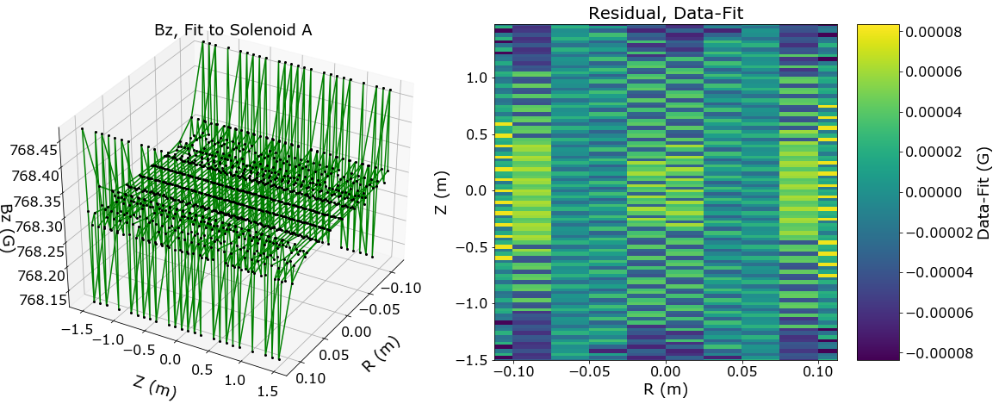

In [186]:
phi=0
fig = mu2e_plot3d(ff.input_data, 'R', 'Z', 'Bz', f'R<0.15 and Phi=={phi} and -2<Z<2',
            title_simp = 'Bz, Fit to Solenoid A', df_fit=True, mode='mpl', ptype='3d', units='m', aspect='rect2', do2pi=True)
#pio.write_image(fig, '/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_bz_A_fit.png')
plt.savefig('/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_bz_A_fit.png')

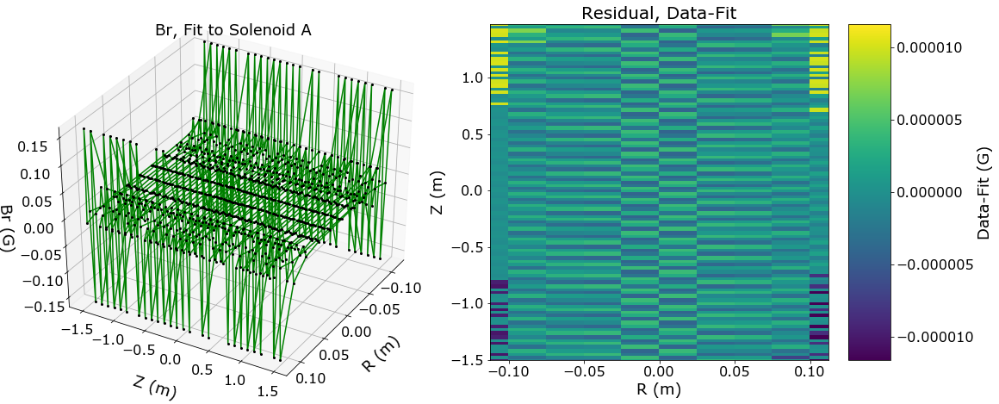

In [183]:
phi=0
fig = mu2e_plot3d(ff.input_data, 'R', 'Z', 'Br', f'R<0.15 and Phi=={phi} and -2<Z<2',
            title_simp = 'Br, Fit to Solenoid A', df_fit=True, mode='mpl', ptype='3d', units='m', aspect='rect2', do2pi=True)
plt.savefig('/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_br_A_fit.png')
#pio.write_image(fig, '/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_br_A_fit.png')

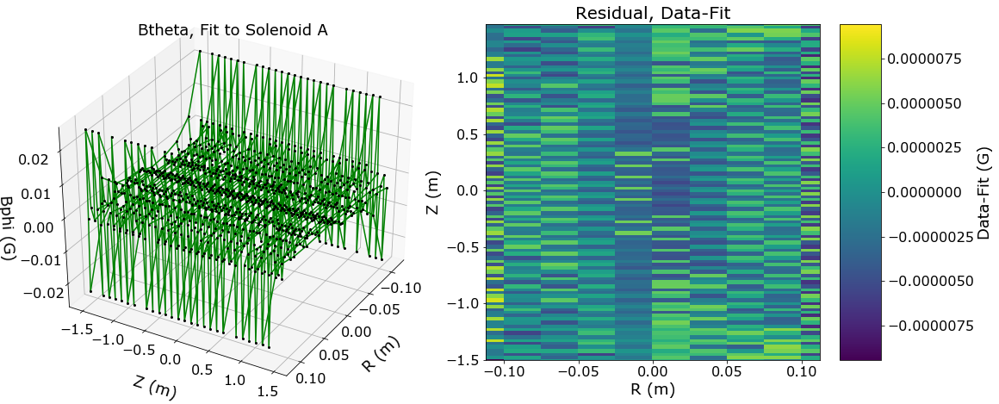

In [184]:
phi=0
fig = mu2e_plot3d(ff.input_data, 'R', 'Z', 'Bphi', f'R<0.15 and Phi=={phi} and -2<Z<2',
            title_simp = 'Btheta, Fit to Solenoid A', df_fit=True, mode='mpl', ptype='3d', units='m', aspect='rect2', do2pi=True)
plt.savefig('/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_bt_A_fit.png')

In [191]:
phi=0.463648
df_long_250mm[np.isclose(df_long_250mm.Phi, phi)].R.unique()

array([0.02795085, 0.0559017 , 0.08385255, 0.1118034 , 0.13975425,
       0.1677051 , 0.19565595, 0.2236068 , 0.25155765, 0.2795085 ])

In [195]:
cfg_pickle_rec = cfg_pickle(use_pickle=True, save_pickle=True,
                             load_name='phi_test', save_name='phi_test', recreate=True)

#for phi in tqdm_notebook((0, np.pi/8, np.pi/4, 3*np.pi/8, np.pi/2, 5*np.pi/8, 3*np.pi/4, 7*np.pi/8), desc='phi'):
#for phi in tqdm_notebook((0,), desc='phi'):

_, ff_fullsim = field_map_analysis('halltoy_phi_test', cfg_data_DS_Cole_Hel_10x,
                                  cfg_geom_hel_250mm_fullsim, cfg_params_Cole,
                                  cfg_pickle_rec, cfg_plot_none)

recreating fit with func_version=120,
n=1, m=2, cn=0, cm=0
Elapsed time was 3.00297 seconds
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 2
    # data points      = 24000
    # variables        = 0
    chi-square         = 0.00000
    reduced chi-square = 0.00000
    Akaike info crit   = -865709.27232
    Bayesian info crit = -865709.27232
[[Variables]]
    R:         0.1 (fixed)
    ns:        1 (fixed)
    ms:        2 (fixed)
    n_scale:   1 (fixed)
    m_scale:   1 (fixed)
    cns:       0 (fixed)
    cms:       0 (fixed)
    A_0_0:     0 (fixed)
    B_0_0:     0 (fixed)
    A_0_1:    -1.216144e-10 (fixed)
    B_0_1:    -1.651544e-09 (fixed)
    k1:        0 (fixed)
    k2:        0 (fixed)
    k3:        0.07682963 (fixed)
    k4:        0 (fixed)
    k5:        0 (fixed)
    k6:        0 (fixed)
    k7:        0 (fixed)
    k8:        0 (fixed)
    k9:        0 (fixed)
    k10:       0 (fixed)
    x1:        0.1567054 (fixed)
    y1:       -0.05435

In [199]:
df_fs =ff_fullsim.input_data

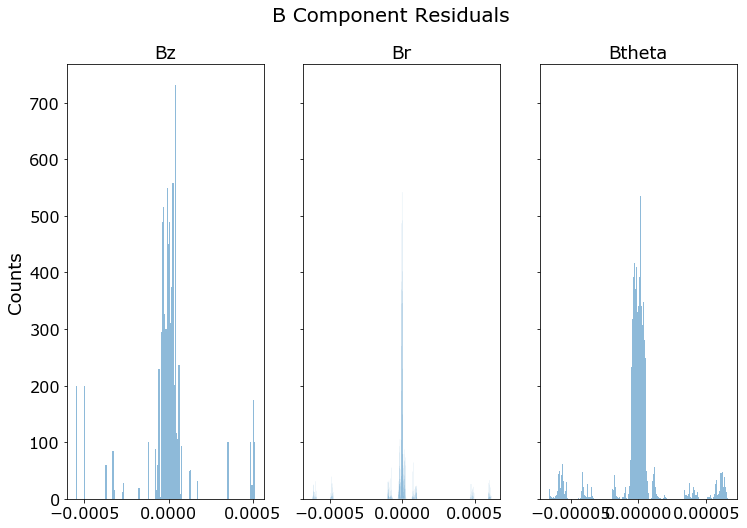

In [213]:
fig, ax = plt.subplots(nrows=1, ncols=3, sharey=True)
_ = splt.hist((df_fs.Bz-df_fs.Bz_fit)*1e4, ax=ax[0])
ax[0].set_title('Bz')
ax[0].set_ylabel('Counts')
_ = splt.hist((df_fs.Br-df_fs.Br_fit)*1e4, ax=ax[1])
ax[1].set_title('Br')
_ = splt.hist((df_fs.Bphi-df_fs.Bphi_fit)*1e4, ax=ax[2])
ax[2].set_title('Btheta')
fig.suptitle('B Component Residuals')
plt.savefig('/Users/brianpollack/Documents/Notes_Papers/Helix/figs/fig_res_A.pdf')